In [154]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Import our data

In [2]:
%%time

# Exported using Xiaomi Mi Band Tools
%time df = pd.read_csv("data/Export-2021-01-21-18-37-56.csv")
%time df.dateTime = pd.to_datetime(df.dateTime, format=r"%d.%m.%Y %H:%M:%S")
%time df.rateZone = df.rateZone.str.rstrip("%").astype("float") / 100

df = df.set_index("dateTime").sort_index()

CPU times: user 2.11 s, sys: 285 ms, total: 2.4 s
Wall time: 2.4 s
CPU times: user 14.3 s, sys: 117 ms, total: 14.4 s
Wall time: 14.2 s
CPU times: user 1.47 s, sys: 100 ms, total: 1.57 s
Wall time: 1.57 s
CPU times: user 18.2 s, sys: 551 ms, total: 18.7 s
Wall time: 18.6 s


# Draw some graphs

<AxesSubplot:title={'center':'Monthly average heart rate'}, xlabel='Date', ylabel='Heart Rate (BPM)'>

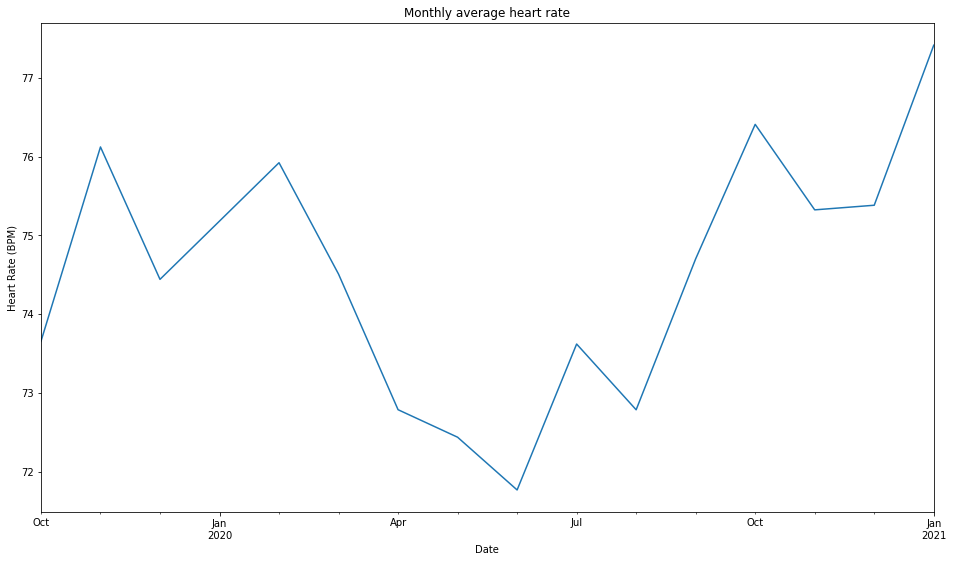

In [57]:
df.rate.resample("1M").mean().plot(
    figsize=(16,9), 
    title="Monthly average heart rate",
    xlabel="Date",
    ylabel="Heart Rate (BPM)",
    )

<AxesSubplot:title={'center':'Daily average heart rate'}, xlabel='Day of week (Monday is 0)', ylabel='Heart Rate (BPM)'>

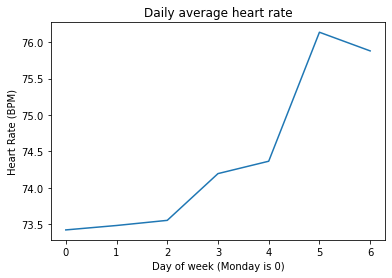

In [40]:
df.rate.groupby(
    df.index.weekday
    ).mean().plot(
        title="Daily average heart rate", 
        xlabel="Day of week (Monday is 0)",
        ylabel="Heart Rate (BPM)",
        )

<AxesSubplot:title={'center':'Hourly average heart rate'}, xlabel='Hour of Day', ylabel='Heart Rate (BPM)'>

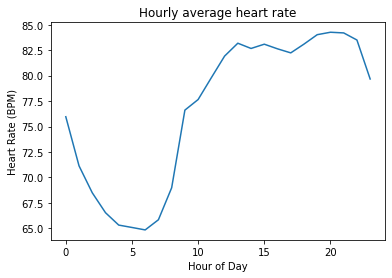

In [43]:
df.rate.groupby(
    df.index.hour
    ).mean().plot(
        title="Hourly average heart rate",
        ylabel="Heart Rate (BPM)",
        xlabel="Hour of Day",
        )

<AxesSubplot:title={'center':'Monthly rolling heart rate'}, xlabel='Date', ylabel='Heart Rate (BPM)'>

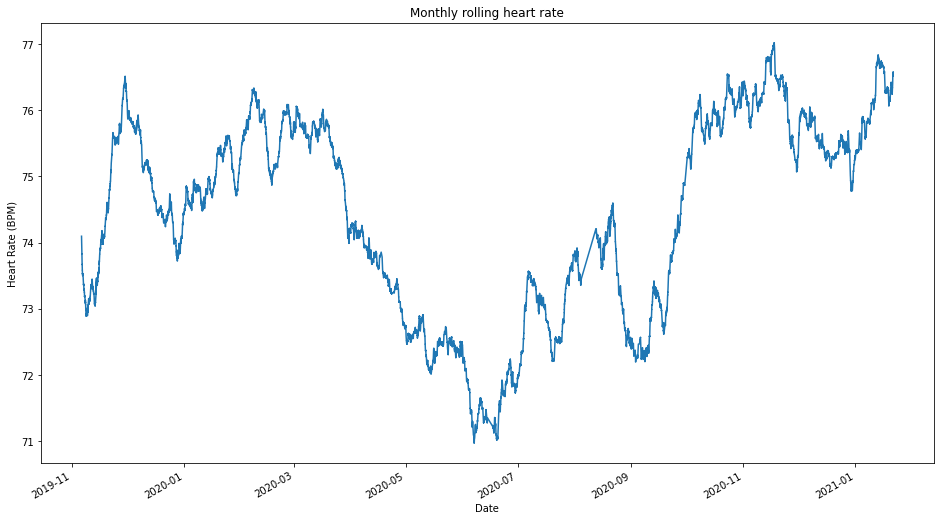

In [62]:
window = pd.Timedelta(weeks=4)
df.rate.rolling(window).mean()[
    df.index.min() + window:
    ].plot(
        figsize=(16,9),
        title="Monthly rolling heart rate",
        xlabel="Date",
        ylabel="Heart Rate (BPM)"
        )

In [77]:
work = df[
    (df.index.hour >= 10)      # After 10 AM
    & (df.index.hour <= 18)    # Before 6 PM
    & (df.index.weekday >= 0 ) # After Monday
    & (df.index.weekday <= 4)  # Before Saturday
    ]

<AxesSubplot:title={'center':'Monthly rolling heart rate'}, xlabel='Date', ylabel='Heart Rate (BPM)'>

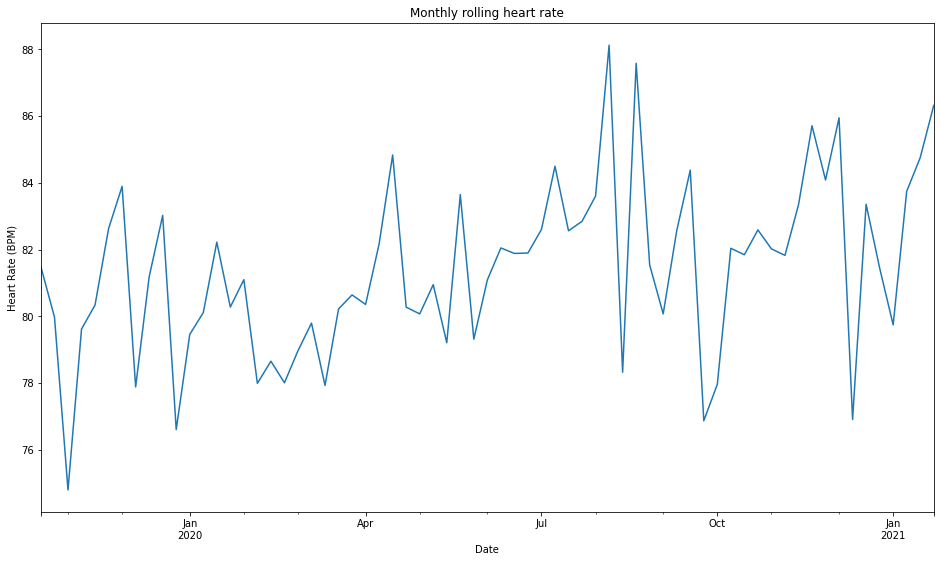

In [82]:
work.rate.resample("1W").mean()[
    work.index.min() + pd.Timedelta(weeks=1): # Slice out the first incomplete window
    ].plot(
        figsize=(16,9),
        title="Monthly rolling heart rate",
        xlabel="Date",
        ylabel="Heart Rate (BPM)"
        )

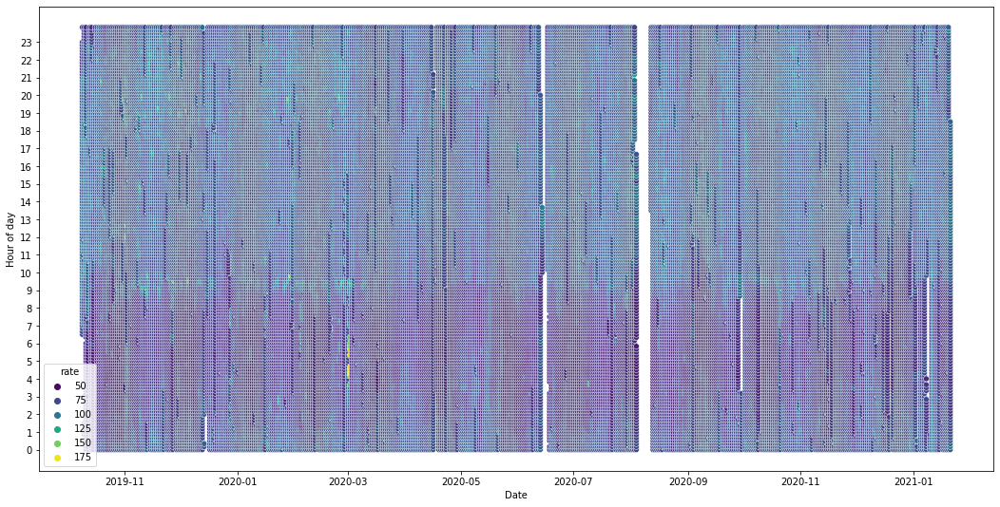

In [165]:
fig: plt.Figure
ax:  plt.Axes
fig, ax = plt.subplots(figsize=(18,9))

resampled = df.resample("10min").mean()
sns.scatterplot(
    alpha=1,
    ax=ax,
    hue=resampled.rate,
    palette="viridis",
    x=resampled.index.date, 
    y=(resampled.index.hour * 60 + resampled.index.minute), 
    )

ax.set_xlabel("Date")

ax.set_ylabel("Hour of day")
ax.set_yticks([hour * 60 for hour in range(24)])
ax.set_yticklabels(list(range(24)))

fig.show()

In [178]:
grouped = df
grouped = grouped.drop(columns="rateZone")
grouped["date"] = grouped.index.date
grouped["hour"] = grouped.index.hour


In [180]:
%%time

grouped = grouped.groupby(["date", "hour"])

<AxesSubplot:xlabel='None-date', ylabel='hour'>

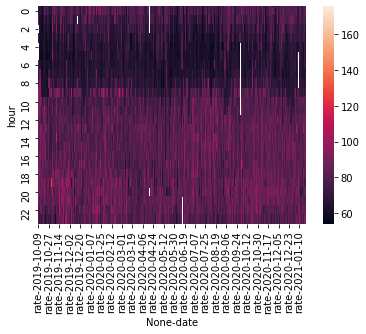

In [185]:
sns.heatmap(grouped.mean().unstack(level=0))